In [1]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt 
import numpy as np

In [3]:
heart = pd.read_csv('heart.csv') 

In [4]:
heart.head(5)

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [5]:
heart.dtypes

age           int64
sex           int64
cp            int64
trtbps        int64
chol          int64
fbs           int64
restecg       int64
thalachh      int64
exng          int64
oldpeak     float64
slp           int64
caa           int64
thall         int64
output        int64
dtype: object

In [6]:
heart.isnull().sum()

age         0
sex         0
cp          0
trtbps      0
chol        0
fbs         0
restecg     0
thalachh    0
exng        0
oldpeak     0
slp         0
caa         0
thall       0
output      0
dtype: int64

In [7]:
heart.describe()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


In [8]:
heart.shape

(303, 14)

1. age - age in years

2. sex - sex (1 = male; 0 = female)

3. cp - chest pain type (1 = typical angina; 2 = atypical angina; 3 = non-anginal pain; 0 = asymptomatic)

4. trestbps - resting blood pressure (in mm Hg on admission to the hospital)

5. chol - serum cholestoral in mg/dl

6. fbs - fasting blood sugar > 120 mg/dl (1 = true; 0 = false)

7. restecg - resting electrocardiographic results (1 = normal; 2 = having ST-T wave abnormality; 0 = hypertrophy)

8. thalach - maximum heart rate achieved

9. exang - exercise induced angina (1 = yes; 0 = no)

10. oldpeak - ST depression induced by exercise relative to rest

11. slope - the slope of the peak exercise ST segment (2 = upsloping; 1 = flat; 0 = downsloping)

12. ca - number of major vessels (0-3) colored by flourosopy

13. thal - 2 = normal; 1 = fixed defect; 3 = reversable defect

14. num - the predicted attribute - diagnosis of heart disease (angiographic disease status) (Value 0 = < diameter narrowing; Value 1 = > 50% diameter narrowing)

In [9]:
heart['cp'].unique()

array([3, 2, 1, 0], dtype=int64)

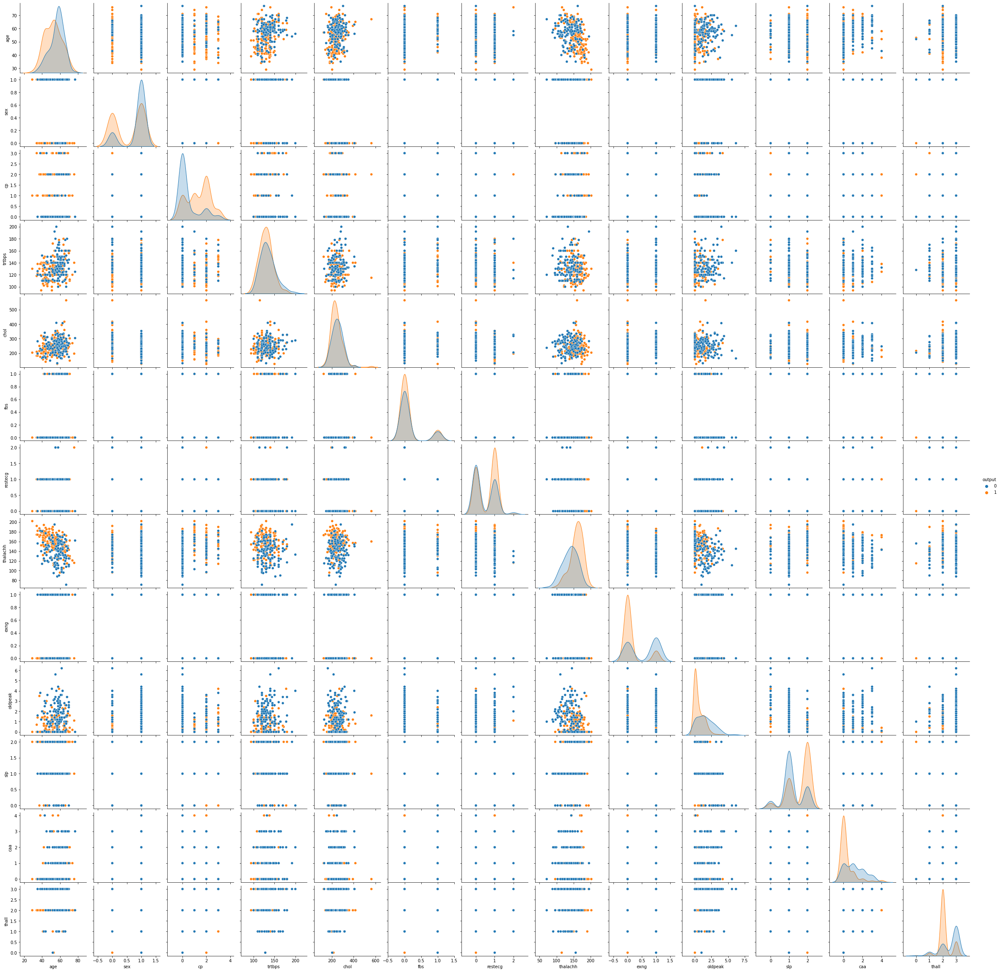

In [10]:
sns.pairplot(heart, hue= 'output') 

fbs         0.028046
chol        0.085239
restecg     0.137230
trtbps      0.144931
age         0.225439
sex         0.280937
thall       0.344029
slp         0.345877
caa         0.391724
thalachh    0.421741
oldpeak     0.430696
cp          0.433798
exng        0.436757
output      1.000000
Name: output, dtype: float64


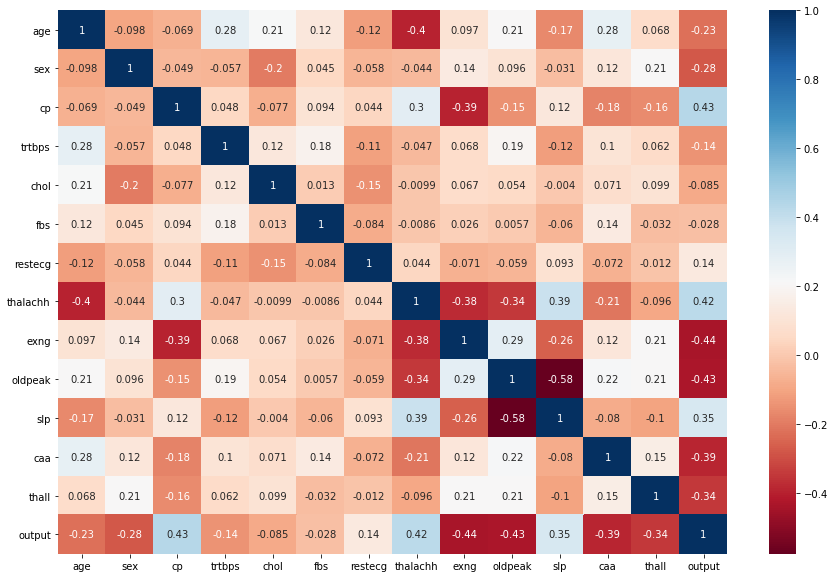

In [11]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(heart.corr(), annot = True, cmap = 'RdBu')
plt.show
print (heart.corr()['output'].abs().sort_values())

<AxesSubplot:xlabel='sex', ylabel='output'>

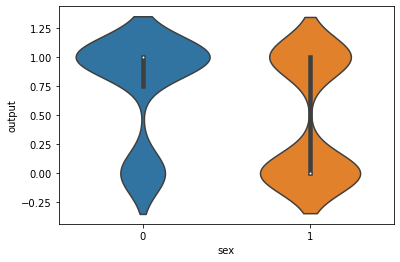

In [12]:
sns.violinplot(x = heart['sex'] , y=heart['output'] )

In [13]:
women_heart = heart.loc[heart.sex == 0]['output']
women_heart_percentage = sum(women_heart)/len(women_heart)
print('The % of women prone to heart-attack: {}%'.format(women_heart_percentage*100))


The % of women prone to heart-attack: 75.0%


<AxesSubplot:xlabel='slp', ylabel='oldpeak'>

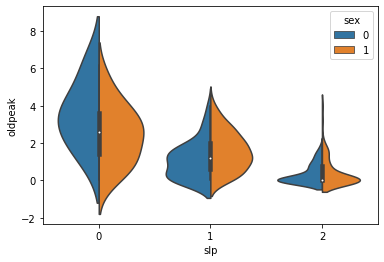

In [14]:
sns.violinplot(x = heart['slp'] , y = heart['oldpeak'], hue = heart['sex'], split = True)


<AxesSubplot:xlabel='slp', ylabel='output'>

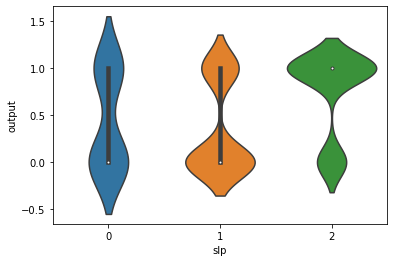

In [15]:
sns.violinplot(x = heart['slp'] , y=heart['output'] )

<AxesSubplot:xlabel='caa', ylabel='output'>

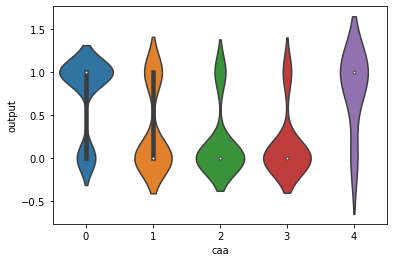

In [16]:
sns.violinplot(x = heart['caa'] , y=heart['output'] )

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = heart.drop('output', axis = 1)        
y = heart['output']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state= 0)

In [18]:
from sklearn import svm
from sklearn.model_selection import cross_val_score
clf = svm.SVC(kernel='linear', C=1)
scores = cross_val_score(clf, X, y, cv=10)
scores

array([0.87096774, 0.80645161, 0.87096774, 0.9       , 0.9       ,
       0.76666667, 0.93333333, 0.83333333, 0.73333333, 0.73333333])

In [19]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.gaussian_process.kernels import RBF
from sklearn.gaussian_process import GaussianProcessClassifier
import xgboost as xgb

In [20]:
preprocess = make_pipeline(StandardScaler())
DecisionTree_PPL = make_pipeline(preprocess, DecisionTreeClassifier(random_state = 0))
RForest_PPL = make_pipeline(preprocess, RandomForestClassifier(random_state = 0))
Ada_PPL = make_pipeline(preprocess, AdaBoostClassifier(random_state = 0))
GB_PPL = make_pipeline(preprocess, GradientBoostingClassifier(random_state = 0))
SVM_PPL = make_pipeline(preprocess, SVC(random_state = 0 ,probability = True))
KNN_PPL = make_pipeline(preprocess, KNeighborsClassifier())
XG_PPL = make_pipeline(preprocess, xgb.XGBClassifier())

kernel = 1.0 * RBF(1.0)
GaussianPPL = make_pipeline(GaussianProcessClassifier(kernel = kernel , random_state = 0))

In [21]:
models = { 'DecisionTree' : DecisionTree_PPL, 
          'RandomForest' : RForest_PPL , 
          'AdaBoost' : Ada_PPL , 
          'GradientBoosting': GB_PPL,
          'SupportVectorClassifier' : SVM_PPL, 
          'KNeighborsClassifier' : KNN_PPL, 
          'GaussianProcess': GaussianPPL,
          'XGBOOST' : XG_PPL
         } 

In [22]:
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, classification_report, roc_curve, mean_absolute_error
from sklearn.model_selection import learning_curve, cross_val_score, GridSearchCV

def evaluation(model):
    model.fit(X_train, y_train)
    # calculating the probabilities
    y_pred_proba = model.predict_proba(X_test)

    # finding the predicted valued
    y_pred = np.argmax(y_pred_proba,axis=1)
    print('Accuracy = ', accuracy_score(y_test, y_pred))
    print('-')
    print(confusion_matrix(y_test,y_pred))
    

In [23]:
for name, model in models.items():
    print('---------------------------------')
    print(name)
    evaluation(model) 

---------------------------------
DecisionTree
Accuracy =  0.7704918032786885
-
[[22  5]
 [ 9 25]]
---------------------------------
RandomForest
Accuracy =  0.8688524590163934
-
[[24  3]
 [ 5 29]]
---------------------------------
AdaBoost
Accuracy =  0.9016393442622951
-
[[25  2]
 [ 4 30]]
---------------------------------
GradientBoosting
Accuracy =  0.8032786885245902
-
[[21  6]
 [ 6 28]]
---------------------------------
SupportVectorClassifier
Accuracy =  0.8524590163934426
-
[[21  6]
 [ 3 31]]
---------------------------------
KNeighborsClassifier
Accuracy =  0.819672131147541
-
[[21  6]
 [ 5 29]]
---------------------------------
GaussianProcess
Accuracy =  0.45901639344262296
-
[[27  0]
 [33  1]]
---------------------------------
XGBOOST


C:\Users\19725\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy =  0.7868852459016393
-
[[21  6]
 [ 7 27]]


In [24]:
print(models['DecisionTree'].named_steps['decisiontreeclassifier'].feature_importances_)

[0.16037658 0.04753031 0.25340799 0.04946002 0.0422224  0.0249639
 0.01560243 0.08449066 0.00887605 0.07710057 0.         0.1619417
 0.07402739]


In [25]:
print("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy: 0.83 (+/- 0.14)


In [26]:
print(Ada_PPL.feature_importances_)

AttributeError: 'Pipeline' object has no attribute 'feature_importances_'

In [ ]:
def Ada_eval (model):
    model.fit(X_train, y_train)
    # calculating the probabilities
    y_pred_proba = model.predict_proba(X_test)

    # finding the predicted valued
    y_pred = np.argmax(y_pred_proba,axis=1)
    print('Accuracy = ', accuracy_score(y_test, y_pred))
    print('-')
    print(confusion_matrix(y_test,y_pred))
    print('-')
    print(classification_report(y_test,y_pred))
    plot_roc_curve(model, X_test, y_test)

# Highest Accuracy Score was AdaBoost 

In [ ]:
Ada_PPL.fit(X_train , y_train)
y_prob = Ada_PPL.predict_proba(X_test)
y_pred = np.argmax(y_prob , axis = 1)

Ada_eval (Ada_PPL)

Accuracy =  0.9016393442622951
-
[[25  2]
 [ 4 30]]
-
              precision    recall  f1-score   support

           0       0.86      0.93      0.89        27
           1       0.94      0.88      0.91        34

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61



NameError: name 'plot_roc_curve' is not defined

Object `named_steps` not found.
